In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [4]:
df = pd.read_csv("lineberger_study_data.csv")

In [6]:
df.drop("Unnamed: 0", axis=1, inplace=True)

In [7]:
# Predict normalized survival across several cancer types
# from a set of 17 genes (g0 - g16)
df.head()

,survival_normalized,g0,g1,g2,g3,g4,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16
0,162.0,-1.899112,-6.828488,0.069213,-0.554842,-0.896690,14.172011,32.687909,-0.678617,-64.812548,-10.721686,-7.758537,37.523931,-231.263396,45.963081,-26.290816,67.943612,-47.242922
1,163.0,-1.871867,-11.288045,-0.649032,-0.232348,3.330865,53.707229,6.720781,-98.633338,-18.021141,-79.142904,15.128356,-96.162151,163.573959,-100.297776,-8.387626,-24.698256,13.903358
2,164.0,2.298674,-2.723340,-0.451990,-0.541226,-10.223753,-80.672098,-19.010697,109.962482,-123.573809,-111.735889,6.182055,43.942510,-14.658361,5.662201,-8.816030,66.776451,-97.106807
3,165.0,-0.012713,3.933514,0.410917,-0.743704,2.191171,33.020904,16.088493,-86.920861,-71.529379,15.581413,-11.456608,-26.230100,117.757913,-191.889019,6.202544,-34.336538,-55.330980
4,166.0,1.036401,-1.102663,-0.216935,-1.662699,-10.697938,-118.164102,13.069330,12.899489,-44.465947,-9.598461,31.297052,-39.375772,154.765486,-218.115365,25.912882,-72.329837,38.553505


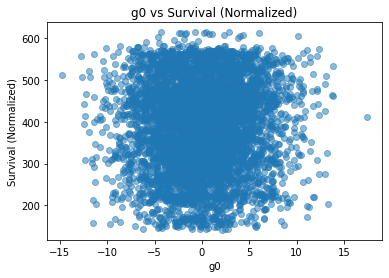

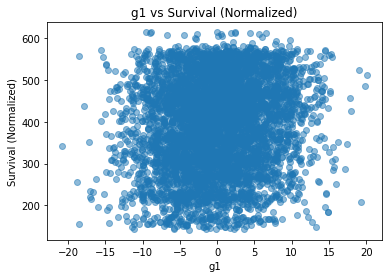

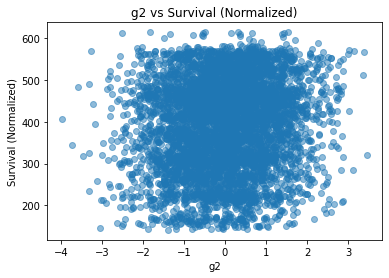

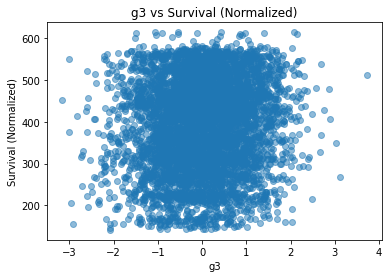

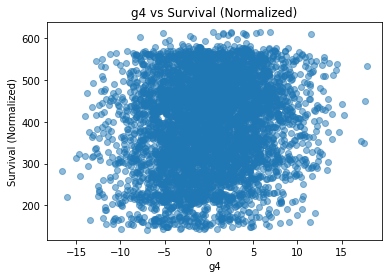

...

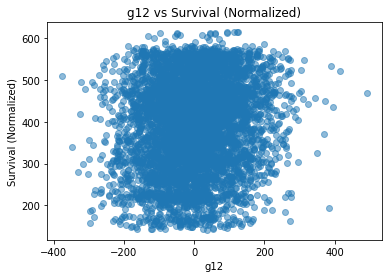

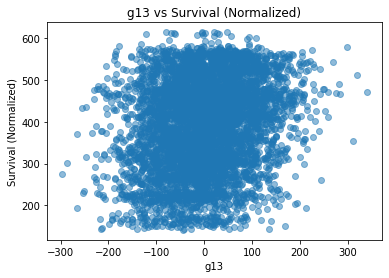

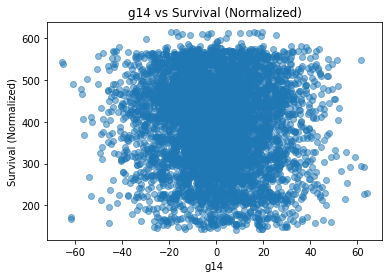

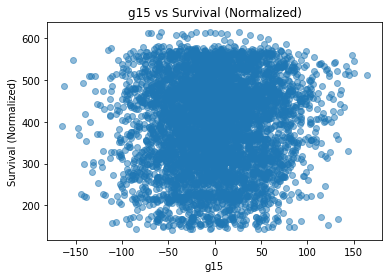

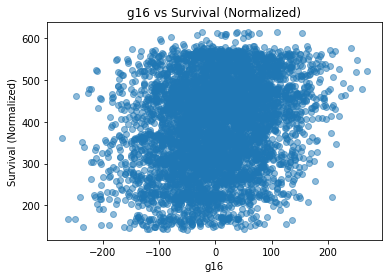

In [53]:
# Which predictors appear most strongly linearly correlated with y?
# g5, g8, g9, g16 seem to be positively correlated with y
# g10 seems to be negatively correlated with y

y = df.survival_normalized
predictors = ['g0', 'g1', 'g2', 'g3', 'g4', 'g5', 'g6', 'g7', 'g8', 'g9', 'g10', 'g11', 'g12', 
              'g13', 'g14','g15', 'g16']

for predictors in predictors:
    plt.scatter(df[predictors], y, alpha=0.5)
    plt.xlabel(predictors)
    plt.ylabel("Survival (Normalized)")
    plt.title(predictors + " vs " + "Survival (Normalized)")
    plt.show()


In [54]:
# Based on the correlation matrix, it seems like g9 and g16 are the top 2 positively correlated predictors with y
# g10 and g14 is negatively correlated
df.corr()

,survival_normalized,g0,g1,g2,g3,g4,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16
survival_normalized,1.000000,0.029616,0.128110,0.114048,0.083599,0.144196,0.209654,0.089642,0.113166,0.209131,0.262172,-0.115347,0.205891,0.126143,0.205622,-0.053127,0.054104,0.237173
g0,0.029616,1.000000,-0.500000,-0.250000,-0.125000,-0.062500,-0.031250,-0.015625,0.007812,-0.003906,-0.001953,0.000977,-0.000488,0.000244,-0.000122,0.000061,-0.000031,0.000015
g1,0.128110,-0.500000,1.000000,0.500000,0.250000,0.125000,0.062500,0.031250,-0.015625,0.007813,0.003906,-0.001953,0.000977,-0.000488,0.000244,-0.000122,0.000061,-0.000031
g2,0.114048,-0.250000,0.500000,1.000000,0.500000,0.250000,0.125000,0.062500,-0.031250,0.015625,0.007812,-0.003906,0.001953,-0.000977,0.000488,-0.000244,0.000122,-0.000061
g3,0.083599,-0.125000,0.250000,0.500000,1.000000,0.500000,0.250000,0.125000,-0.062500,0.031250,0.015625,-0.007813,0.003906,-0.001953,0.000977,-0.000488,0.000244,-0.000122
g4,0.144196,-0.062500,0.125000,0.250000,0.500000,1.000000,0.500000,0.250000,-0.125000,0.062500,0.031250,-0.015625,0.007813,-0.003906,0.001953,-0.000977,0.000488,-0.000244
g5,0.209654,-0.031250,0.062500,0.125000,0.250000,0.500000,1.000000,0.500000,-0.250000,0.125000,0.062500,-0.031250,0.015625,-0.007812,0.003906,-0.001953,0.000977,-0.000488
g6,0.089642,-0.015625,0.031250,0.062500,0.125000,0.250000,0.500000,1.000000,-0.500000,0.250000,0.125000,-0.062500,0.031250,-0.015625,0.007812,-0.003906,0.001953,-0.000977
g7,0.113166,0.007812,-0.015625,-0.031250,-0.062500,-0.125000,-0.250000,-0.500000,1.000000,-0.500000,-0.250000,0.125000,-0.062500,0.031250,-0.015625,0.007812,-0.003906,0.001953
g8,0.209131,-0.003906,0.007813,0.015625,0.031250,0.062500,0.125000,0.250000,-0.500000,1.000000,0.500000,-0.250000,0.125000,-0.062500,0.031250,-0.015625,0.007812,-0.003906


In [ ]:
# Make scatter plot matrix to find obvious outliers

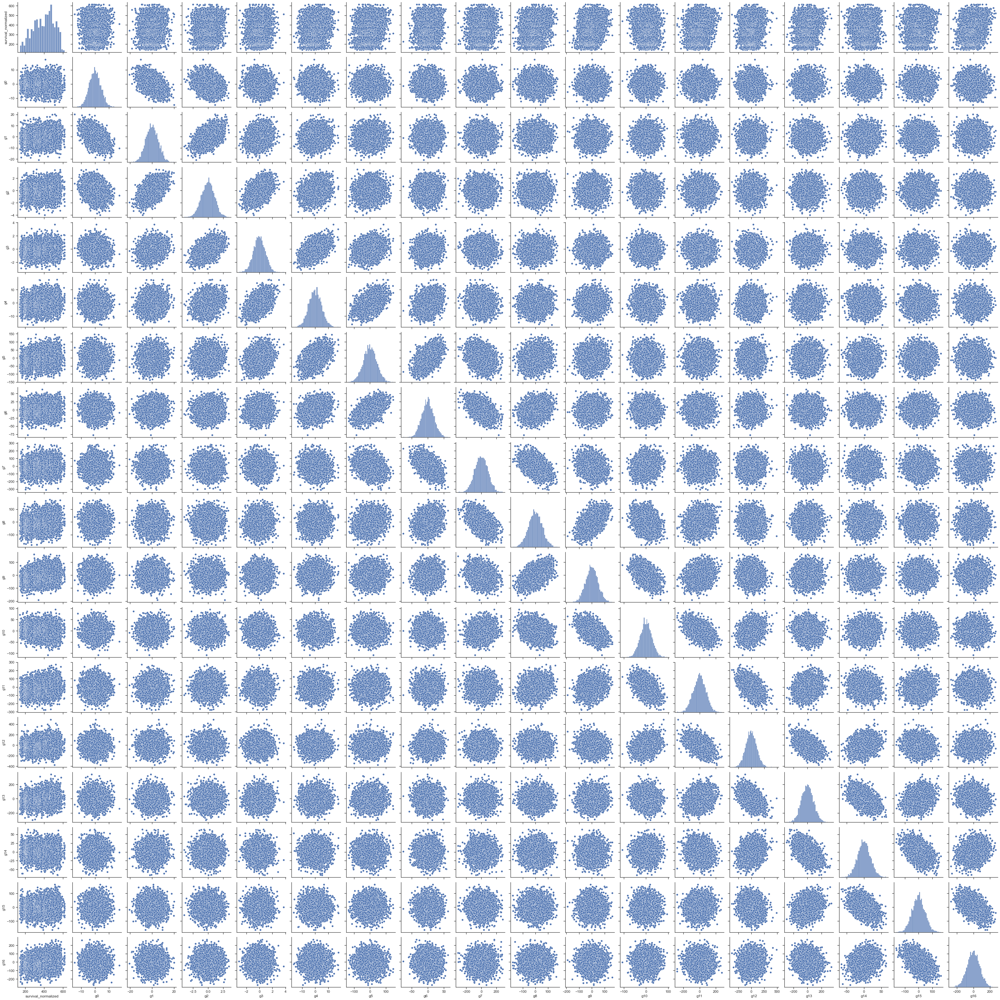

In [55]:
import seaborn as sns
sns.set_theme(style="ticks")

sns.pairplot(df)

In [64]:
# Fit linear model 
# Report estimated coefficients and compute 95% confidence interval 
# Unadjusted R squared = 0.526 

import statsmodels.formula.api as smf

model = smf.ols("survival_normalized ~ g0 + g1 + g2 + g3 + g4 + g5 + g6 + g7 + g8 + g9 + g10 + g11 + g12 + g13 + g14 + g15 + g16", df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     survival_normalized   R-squared:                       0.526
Model:                             OLS   Adj. R-squared:                  0.524
Method:                  Least Squares   F-statistic:                     347.9
Date:                 Sun, 16 Jan 2022   Prob (F-statistic):               0.00
Time:                         17:06:35   Log-Likelihood:                -30707.
No. Observations:                 5354   AIC:                         6.145e+04
Df Residuals:                     5336   BIC:                         6.157e+04
Df Model:                           17                                         
Covariance Type:             nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    392.9283      1.026    383.130      0.000     390.918     394.939
g0             3.2400      0.282     11.472      0.000       2.686       3.794
g1             3.0000      0.232     12.918      0.000       2.545       3.455
g2             5.0000      1.244      4.021      0.000       2.562       7.438
g3            -4.0000      1.483     -2.697      0.007      -6.907      -1.093
g4             1.0000      0.272      3.683      0.000       0.468       1.532
g5             0.5000      0.031     15.900      0.000       0.438       0.562
g6             0.5000      0.072      6.990      0.000       0.360       0.640
g7             0.5000      0.016     31.860      0.000       0.469       0.531
g8             0.5000      0.024     20.475      0.000       0.452       0.548
g9             0.5000      0.028     18.127      0.000       0.446       0.554
g10            0.5000      0.051      9.842      0.000       0.400       0.600
g11            0.5000      0.017     28.784      0.000       0.466       0.534
g12            0.5000      0.013     39.812      0.000       0.475       0.525
g13            0.5000      0.016     32.155      0.000       0.470       0.530
g14            0.5000      0.072      6.951      0.000       0.359       0.641
g15            0.5000      0.029     17.489      0.000       0.444       0.556
g16            0.5000      0.015     32.361      0.000       0.470       0.530
==============================================================================
Omnibus:                     1682.520   Durbin-Watson:                   0.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              392.394
Skew:                           0.409   Prob(JB):                     6.20e-86
Kurtosis:                       1.956   Cond. No.                         204.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
# Fitted values against the residuals

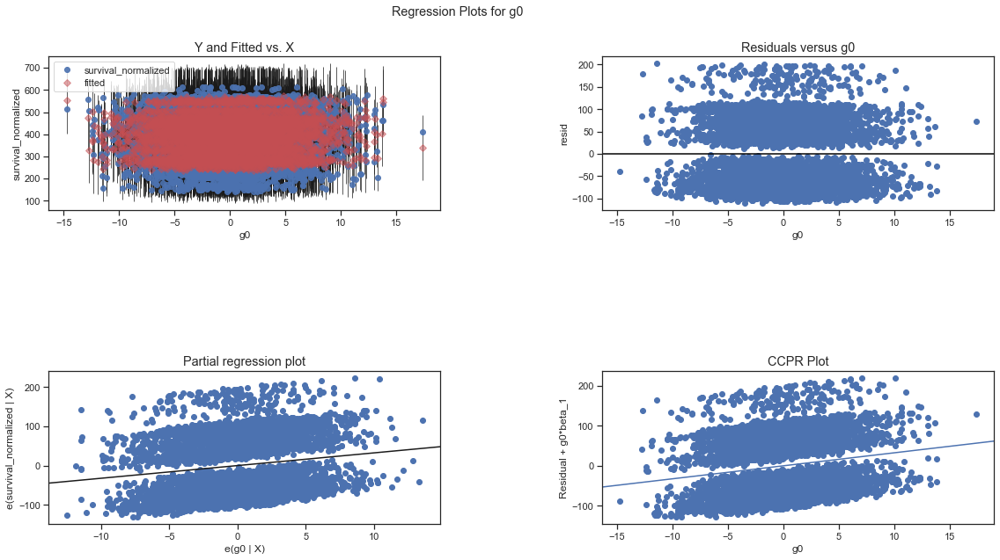

In [75]:
import statsmodels.api as sm

fig = sm.graphics.plot_regress_exog(model, "g0").set_size_inches(18, 10)

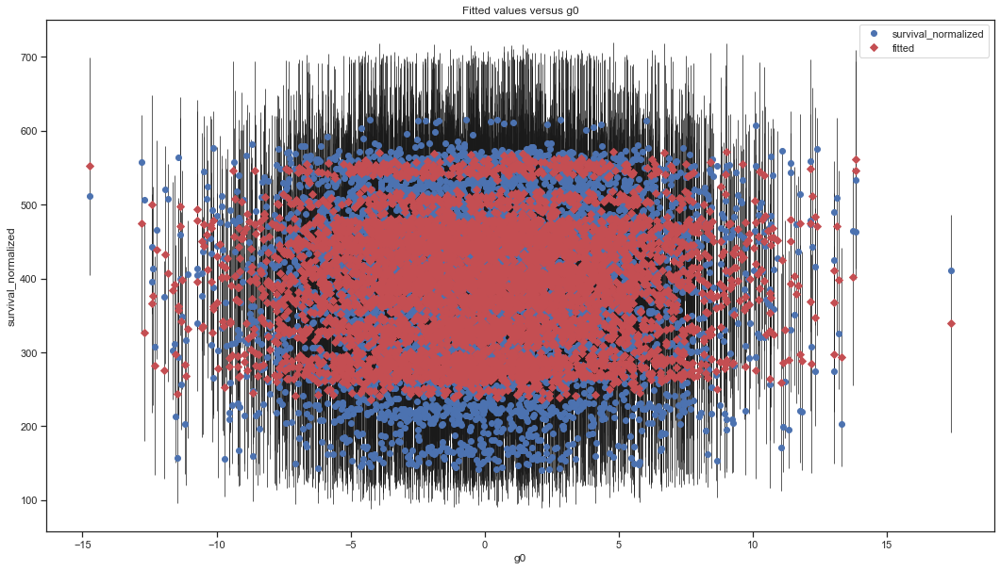

In [74]:
# this looks like surrealism art

fig = sm.graphics.plot_fit(model, "g0").set_size_inches(18, 10)